Path Handling

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [2]:
!ls /content/gdrive/My\ Drive/Udacity-CVND-Image-Captioning-master/*.py

'/content/gdrive/My Drive/Udacity-CVND-Image-Captioning-master/data_loader.py'
'/content/gdrive/My Drive/Udacity-CVND-Image-Captioning-master/data_loader_val.py'
'/content/gdrive/My Drive/Udacity-CVND-Image-Captioning-master/model.py'
'/content/gdrive/My Drive/Udacity-CVND-Image-Captioning-master/vocabulary.py'
'/content/gdrive/My Drive/Udacity-CVND-Image-Captioning-master/workspace_utils.py'


In [3]:
!cat '/content/gdrive/My Drive//Udacity-CVND-Image-Captioning-master/data_loader.py'

import nltk
import os
import torch
import torch.utils.data as data
from vocabulary import Vocabulary
from PIL import Image
from pycocotools.coco import COCO
import numpy as np
from tqdm import tqdm
import random
import json

def get_loader(transform,
               mode='train',
               batch_size=1,
               vocab_threshold=None,
               vocab_file='/content/gdrive/My Drive//Udacity-CVND-Image-Captioning-master/vocab.pkl',
               start_word="<start>",
               end_word="<end>",
               unk_word="<unk>",
               vocab_from_file=True,
               num_workers=0,
               cocoapi_loc='/content/opt'):
               
    """Returns the data loader.
    Args:
      transform: Image transform.
      mode: One of 'train' or 'test'.
      batch_size: Batch size (if in testing mode, must have batch_size=1).
      vocab_threshold: Minimum word count threshold.
      vocab_file: File containing the vocabulary. 
      start_word: Special wor

In [0]:
import sys
sys.path.append('/content/gdrive/My Drive/Udacity-CVND-Image-Captioning-master/')

In [5]:
import numpy as np
import tensorflow as tf
import os
import torch
import math
import torch.nn as nn
from torchvision import transforms
from torch.optim import Adam
from workspace_utils import keep_awake
from PIL import Image
import PIL.Image
from torchvision.transforms import *
import matplotlib.pyplot as plt
from moviepy.editor import CompositeVideoClip 
from moviepy.editor import vfx
from moviepy.editor import TextClip
from moviepy.editor import concatenate_videoclips
from moviepy.editor import VideoFileClip
from moviepy.editor import AudioFileClip
from moviepy.editor import ImageClip , concatenate_videoclips
%matplotlib inline

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2449408/45929032 bytes (5.3%)6545408/45929032 bytes (14.3%)10846208/45929032 bytes (23.6%)14647296/45929032 bytes (31.9%)18685952/45929032 bytes (40.7%)22872064/45929032 bytes (49.8%)26935296/45929032 bytes (58.6%)31170560/45929032 bytes (67.9%)35414016/45929032 bytes (77.1%)39370752/45929032 bytes (85.7%)43253760/45929032 bytes (94.2%)45929032/45929032 bytes (100.0%)
  Done
File saved as /root

Test Data loader

In [6]:
# Download image files
image_folder = '/test2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
  image_zip = tf.keras.utils.get_file('test2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin = 'http://images.cocodataset.org/zips/test2014.zip',
                                      extract = True)
  PATH = os.path.dirname(image_zip) + image_folder
  os.remove(image_zip)
else:
  PATH = os.path.abspath('.') + image_folder

6660440064/6660437059 [==============================] - 142s 0us/step


In [7]:
annotation_folder = '/annotations/'
if not os.path.exists(os.path.abspath('.') + annotation_folder):
  annotation_zip = tf.keras.utils.get_file('captions.zip',
                                          cache_subdir=os.path.abspath('.'),
                                          origin = 'http://images.cocodataset.org/annotations/image_info_test2014.zip',
                                          extract = True)
  # annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
  os.remove(annotation_zip)

770048/763464 [==============================] - 0s 0us/step


In [8]:
import sys
# sys.path.append('/opt/cocoapi/PythonAPI')
from pycocotools.coco import COCO
from data_loader import get_loader
from torchvision import transforms

# TODO #1: Define a transform to pre-process the testing images.
transform_test = transforms.Compose([ 
    transforms.Resize((224,224)),                          # smaller edge of image resized to 256
    transforms.ToTensor(),                           # convert the PIL Image to a tensor
    transforms.Normalize((0.485, 0.456, 0.406),      # normalize image for pre-trained model
                         (0.229, 0.224, 0.225))])

#-#-#-# Do NOT modify the code below this line. #-#-#-#

# Create the data loader.
data_loader = get_loader(transform=transform_test,    
                         mode='test')

Vocabulary successfully loaded from vocab.pkl file!


In [0]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Loading weights of the the training network

In [10]:
# Watch for any changes in model.py, and re-load it automatically.
% load_ext autoreload
% autoreload 2

import os
import torch
from model import EncoderCNN, DecoderRNN

# TODO #2: Specify the saved models to load.
encoder_file = 'encoder-f-3.pkl' 
decoder_file = 'decoder-f-3.pkl'

# TODO #3: Select appropriate values for the Python variables below.
embed_size = 512
hidden_size = 512

# The size of the vocabulary.
# vocab_size = len(data_loader.dataset.vocab)
vocab_size =8855
print(vocab_size)

# Initialize the encoder and decoder, and set each to inference mode.
encoder = EncoderCNN(embed_size)
encoder.eval()
decoder = DecoderRNN(embed_size, hidden_size, vocab_size)
decoder.eval()

# Load the trained weights.
encoder.load_state_dict(torch.load(os.path.join('/content/gdrive/My Drive/Udacity-CVND-Image-Captioning-master/', encoder_file)))
decoder.load_state_dict(torch.load(os.path.join('/content/gdrive/My Drive/Udacity-CVND-Image-Captioning-master/', decoder_file)))

# Move models to GPU if CUDA is available.
encoder.to(device)
decoder.to(device)

8855


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


DecoderRNN(
  (embed): Embedding(8855, 512)
  (lstm): LSTM(512, 512, batch_first=True)
  (fc): Linear(in_features=512, out_features=8855, bias=True)
)

In [0]:
# TODO #4: Complete the function.
def clean_sentence(output):
    sentence = ''
    for x in output:
        sentence = sentence + ' ' + data_loader.dataset.vocab.idx2word[x]
        sentence = sentence.strip()
    return sentence

In [0]:
def get_prediction(image_path):
    image1 = Image.open(image_path).convert('RGB')
    plt.imshow(np.squeeze(image1))
    plt.title('Sample Image')
    plt.show()
    image = transform_test(image1)
    # plt.imshow(image.squeeze(0).T)

    # image = ToTensor()(image).unsqueeze(0)
    image = image.to(device)
    features = encoder(image.unsqueeze(0)).unsqueeze(1)
    output = decoder.sample(features)    
    sentence = clean_sentence(output)
    # print(sentence)
    return sentence[7:-6]

Text in image

In [14]:
!sudo apt install tesseract-ocr
!sudo pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 31 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 2s (2,684 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl

In [0]:
from pytesseract import image_to_string
import pytesseract

In [0]:
pytesseract.pytesseract.tesseract_cmd = (
    r"/usr/bin/tesseract"
)

In [0]:
def text_in_image( image_path):
  return pytesseract.image_to_string(Image.open(image_path))

From text Audio

In [18]:
pip install gtts

  Created wheel for gtts-token: filename=gTTS_token-1.1.3-cp36-none-any.whl size=4097 sha256=c0c381098878bd663b2d8ffe6b29aadf9b95cce1cb1f119eb261567a4d52d81e
  Stored in directory: /root/.cache/pip/wheels/dd/11/61/33f7e51bf545e910552b2255eead2a7cd8ef54064b46dceb34
Successfully built gtts-token


In [0]:
from gtts import gTTS 
from IPython.display import Audio
import os 

In [0]:
def text_to_voice( text , language , i ):
  voice = gTTS(text=text, lang=language, slow=False) 
  voice.save("voice%i.mp3"%i)
  sound_file = 'voice%i.mp3'%i
  return sound_file


Audio caption

In [0]:
def aduio_Caption(image_path , i):
  #1
  # image_path = '/content/index.jpeg'
  # image_path ='/content/t3qWG.png'
  # image_path = '/content/final-result.jpg'
  #2
  out_1 =  text_in_image(image_path)
  print(out_1)
  #3
  out_2  = get_prediction(image_path)
  print(out_2)
  #4
  out = out_1 + out_2
  x = text_to_voice(out , 'en' , i)

  #5
  return x 

Video Caption

In [0]:
def vedio_caption( i , fps ):  
  audio = AudioFileClip('/content/voice%i.mp3'%i)
  image = ImageClip('/content/my%i.png'%i).set_duration(audio.duration)

  video = image.set_audio(audio)
  # outfile = f"{os.path.splitext(sys.argv[1])[0]}_with_image.mp4" # 3.

  video.write_videofile( 'video_with_python_%i.mp4'%i ,fps=fps)
  the_vedio1 = VideoFileClip('video_with_python_%i.mp4'%i)
  return the_vedio1

Scene change detection

In [24]:
!pip install scenedetect

     |████████████████████████████████| 102kB 3.8MB/s 


In [0]:
from __future__ import print_function
import os

# Standard PySceneDetect imports:
from scenedetect.video_manager import VideoManager
from scenedetect.scene_manager import SceneManager
# For caching detection metrics and saving/loading to a stats file
from scenedetect.stats_manager import StatsManager

# For content-aware scene detection:
from scenedetect.detectors.content_detector import ContentDetector


def find_scenes(video_path):
    # type: (str) -> List[Tuple[FrameTimecode, FrameTimecode]]
    video_manager = VideoManager([video_path])
    stats_manager = StatsManager()
    # Construct our SceneManager and pass it our StatsManager.
    scene_manager = SceneManager(stats_manager)

    # Add ContentDetector algorithm (each detector's constructor
    # takes detector options, e.g. threshold).
    scene_manager.add_detector(ContentDetector())
    base_timecode = video_manager.get_base_timecode()

    # We save our stats file to {VIDEO_PATH}.stats.csv.
    stats_file_path = '%s.stats.csv' % video_path

    scene_list = []

    try:
        # If stats file exists, load it.
        if os.path.exists(stats_file_path):
            # Read stats from CSV file opened in read mode:
            with open(stats_file_path, 'r') as stats_file:
                stats_manager.load_from_csv(stats_file, base_timecode)

        # Set downscale factor to improve processing speed.
        video_manager.set_downscale_factor()

        # Start video_manager.
        video_manager.start()

        # Perform scene detection on video_manager.
        scene_manager.detect_scenes(frame_source=video_manager)

        
        # Obtain list of detected scenes.
        scene_list = scene_manager.get_scene_list(base_timecode)
        # Each scene is a tuple of (start, end) FrameTimecodes.

        print('List of scenes obtained:')
        for i, scene in enumerate(scene_list):
            print(
                'Scene %2d: Start %s / Frame %d, End %s / Frame %d' % (
                i+1,
                scene[0].get_timecode(), scene[0].get_frames(),
                scene[1].get_timecode(), scene[1].get_frames(),))

        # We only write to the stats file if a save is required:
        if stats_manager.is_save_required():
            with open(stats_file_path, 'w') as stats_file:
                stats_manager.save_to_csv(stats_file, base_timecode)

    finally:
        video_manager.release()

    return scene_list

Testing the whole project



1.   Get the vedio and find the scence that has major changes in it
 



In [43]:
vedio_path =  '/content/y2mate.com - Primo Monday is HAM Sandwiches (30 sec) 2019_dHFuHMu31aw_360p.mp4'
frame_list = find_scenes(vedio_path)

100%|██████████| 750/750 [00:01<00:00, 577.97frames/s]


List of scenes obtained:
Scene  1: Start 00:00:00.000 / Frame 0, End 00:00:01.520 / Frame 38
Scene  2: Start 00:00:01.520 / Frame 38, End 00:00:02.760 / Frame 69
Scene  3: Start 00:00:02.760 / Frame 69, End 00:00:05.360 / Frame 134
Scene  4: Start 00:00:05.360 / Frame 134, End 00:00:06.480 / Frame 162
Scene  5: Start 00:00:06.480 / Frame 162, End 00:00:07.760 / Frame 194
Scene  6: Start 00:00:07.760 / Frame 194, End 00:00:09.200 / Frame 230
Scene  7: Start 00:00:09.200 / Frame 230, End 00:00:10.160 / Frame 254
Scene  8: Start 00:00:10.160 / Frame 254, End 00:00:11.440 / Frame 286
Scene  9: Start 00:00:11.440 / Frame 286, End 00:00:12.360 / Frame 309
Scene 10: Start 00:00:12.360 / Frame 309, End 00:00:13.640 / Frame 341
Scene 11: Start 00:00:13.640 / Frame 341, End 00:00:14.640 / Frame 366
Scene 12: Start 00:00:14.640 / Frame 366, End 00:00:16.120 / Frame 403
Scene 13: Start 00:00:16.120 / Frame 403, End 00:00:17.120 / Frame 428
Scene 14: Start 00:00:17.120 / Frame 428, End 00:00:18.240

In [0]:
import csv
 
with open('%s.stats.csv' % vedio_path, newline='') as File:  
    reader = csv.reader(File)
    row1 = next(reader)





2.   For loop over all the frame detected by scene detector and process vedio caption over it


3.  Reconstruct the video.


0
a.
oY

sae


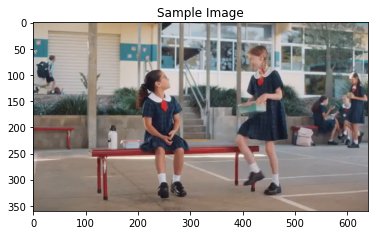

 a man is playing tennis on a court
[MoviePy] >>>> Building video video_with_python_0.mp4
[MoviePy] Writing audio in video_with_python_0TEMP_MPY_wvf_snd.mp3


100%|██████████| 78/78 [00:00<00:00, 910.49it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_0.mp4



100%|██████████| 89/89 [00:00<00:00, 287.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_0.mp4 

38



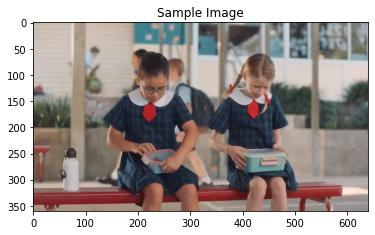

 a man and a woman are sitting on a bench .
[MoviePy] >>>> Building video video_with_python_1.mp4
[MoviePy] Writing audio in video_with_python_1TEMP_MPY_wvf_snd.mp3


100%|██████████| 60/60 [00:00<00:00, 922.83it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_1.mp4



100%|██████████| 68/68 [00:00<00:00, 372.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_1.mp4 

69



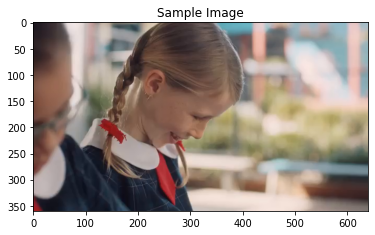

 a man is holding a doughnut and a cup of coffee .
[MoviePy] >>>> Building video video_with_python_2.mp4
[MoviePy] Writing audio in video_with_python_2TEMP_MPY_wvf_snd.mp3


100%|██████████| 70/70 [00:00<00:00, 963.22it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_2.mp4



100%|██████████| 80/80 [00:00<00:00, 329.63it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_2.mp4 

134



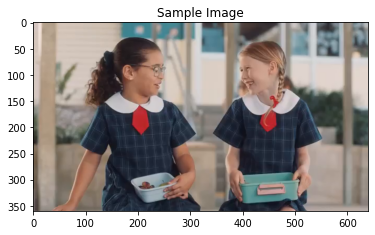

 a man and a woman are standing in a room .
[MoviePy] >>>> Building video video_with_python_3.mp4
[MoviePy] Writing audio in video_with_python_3TEMP_MPY_wvf_snd.mp3


100%|██████████| 62/62 [00:00<00:00, 1022.63it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_3.mp4



100%|██████████| 71/71 [00:00<00:00, 369.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_3.mp4 

162



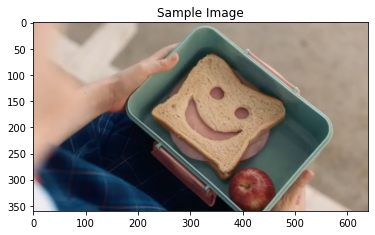

 a pair of scissors and a needle on a white paper .
[MoviePy] >>>> Building video video_with_python_4.mp4
[MoviePy] Writing audio in video_with_python_4TEMP_MPY_wvf_snd.mp3


100%|██████████| 70/70 [00:00<00:00, 1046.19it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_4.mp4



100%|██████████| 79/79 [00:00<00:00, 332.22it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_4.mp4 

194



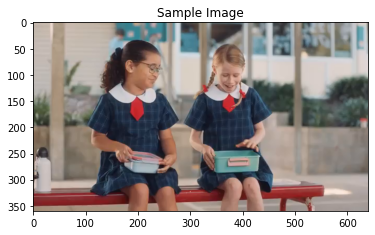

 a man and a woman are playing a video game .
[MoviePy] >>>> Building video video_with_python_5.mp4
[MoviePy] Writing audio in video_with_python_5TEMP_MPY_wvf_snd.mp3


100%|██████████| 63/63 [00:00<00:00, 1007.45it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_5.mp4



100%|██████████| 71/71 [00:00<00:00, 365.49it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_5.mp4 

230



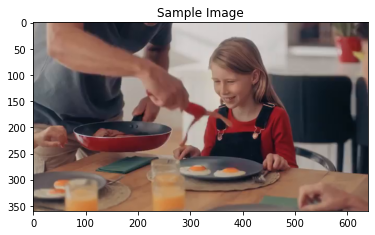

 a woman is eating a slice of pizza .
[MoviePy] >>>> Building video video_with_python_6.mp4
[MoviePy] Writing audio in video_with_python_6TEMP_MPY_wvf_snd.mp3


100%|██████████| 55/55 [00:00<00:00, 1029.08it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_6.mp4



100%|██████████| 62/62 [00:00<00:00, 396.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_6.mp4 

254



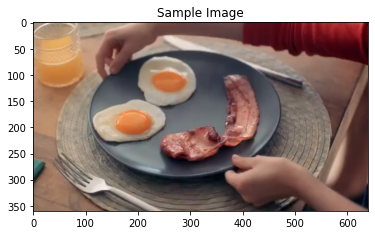

 a person holding a knife over a cutting board .
[MoviePy] >>>> Building video video_with_python_7.mp4
[MoviePy] Writing audio in video_with_python_7TEMP_MPY_wvf_snd.mp3


100%|██████████| 70/70 [00:00<00:00, 1013.56it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_7.mp4



100%|██████████| 79/79 [00:00<00:00, 318.19it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_7.mp4 

286



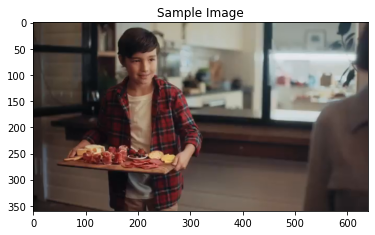

 a man and a woman are standing in a kitchen .
[MoviePy] >>>> Building video video_with_python_8.mp4
[MoviePy] Writing audio in video_with_python_8TEMP_MPY_wvf_snd.mp3


100%|██████████| 61/61 [00:00<00:00, 1019.62it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_8.mp4



100%|██████████| 69/69 [00:00<00:00, 363.42it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_8.mp4 

309



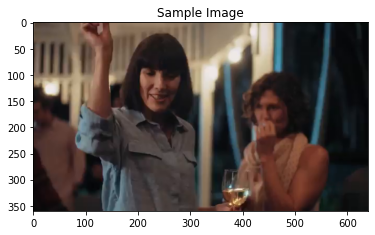

 a man and a woman are standing in a room .
[MoviePy] >>>> Building video video_with_python_9.mp4
[MoviePy] Writing audio in video_with_python_9TEMP_MPY_wvf_snd.mp3


100%|██████████| 62/62 [00:00<00:00, 901.34it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_9.mp4



100%|██████████| 71/71 [00:00<00:00, 363.27it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_9.mp4 

341



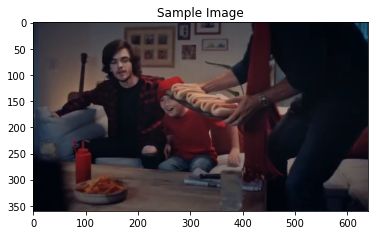

 a man and a woman are standing in a room .
[MoviePy] >>>> Building video video_with_python_10.mp4
[MoviePy] Writing audio in video_with_python_10TEMP_MPY_wvf_snd.mp3


100%|██████████| 62/62 [00:00<00:00, 987.06it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_10.mp4



100%|██████████| 71/71 [00:00<00:00, 373.06it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_10.mp4 

366



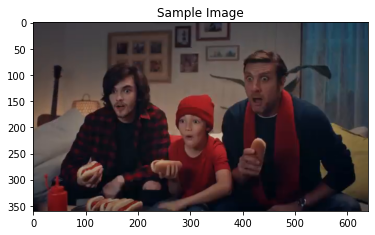

 a group of people standing around a table .
[MoviePy] >>>> Building video video_with_python_11.mp4
[MoviePy] Writing audio in video_with_python_11TEMP_MPY_wvf_snd.mp3


100%|██████████| 63/63 [00:00<00:00, 1044.89it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_11.mp4



100%|██████████| 71/71 [00:00<00:00, 344.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_11.mp4 

403



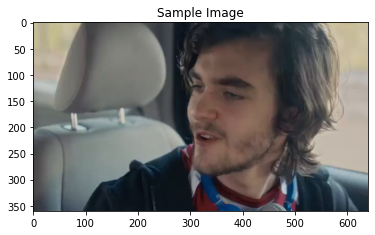

 a man wearing a neck tie and a shirt .
[MoviePy] >>>> Building video video_with_python_12.mp4
[MoviePy] Writing audio in video_with_python_12TEMP_MPY_wvf_snd.mp3


100%|██████████| 60/60 [00:00<00:00, 1037.02it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_12.mp4



100%|██████████| 68/68 [00:00<00:00, 346.23it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_12.mp4 

428



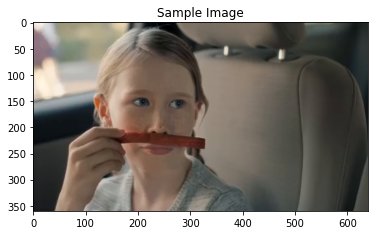

 a woman is holding a cell phone in her hand .
[MoviePy] >>>> Building video video_with_python_13.mp4
[MoviePy] Writing audio in video_with_python_13TEMP_MPY_wvf_snd.mp3


100%|██████████| 67/67 [00:00<00:00, 1049.77it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_13.mp4



100%|██████████| 76/76 [00:00<00:00, 336.91it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_13.mp4 

456



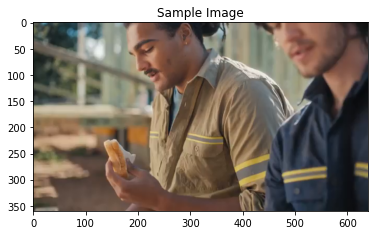

 a man and a woman are cutting a cake .
[MoviePy] >>>> Building video video_with_python_14.mp4
[MoviePy] Writing audio in video_with_python_14TEMP_MPY_wvf_snd.mp3


100%|██████████| 53/53 [00:00<00:00, 970.26it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_14.mp4



 98%|█████████▊| 60/61 [00:00<00:00, 434.73it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_14.mp4 

482



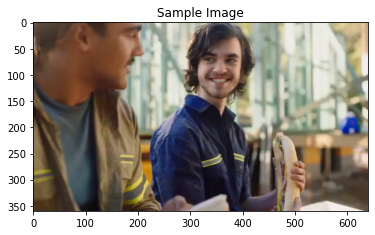

 a man and a woman are smiling at the camera .
[MoviePy] >>>> Building video video_with_python_15.mp4
[MoviePy] Writing audio in video_with_python_15TEMP_MPY_wvf_snd.mp3


100%|██████████| 63/63 [00:00<00:00, 915.30it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_15.mp4



100%|██████████| 71/71 [00:00<00:00, 305.52it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_15.mp4 

508



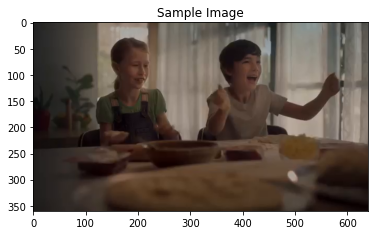

 a group of people are sitting at a table .
[MoviePy] >>>> Building video video_with_python_16.mp4
[MoviePy] Writing audio in video_with_python_16TEMP_MPY_wvf_snd.mp3


100%|██████████| 59/59 [00:00<00:00, 862.70it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_16.mp4



 99%|█████████▊| 66/67 [00:00<00:00, 373.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_16.mp4 

534



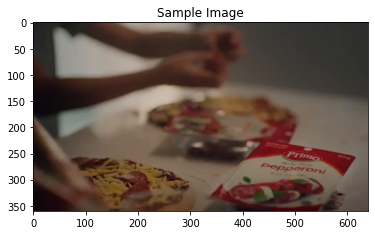

 a person holding a slice of pizza in a box .
[MoviePy] >>>> Building video video_with_python_17.mp4
[MoviePy] Writing audio in video_with_python_17TEMP_MPY_wvf_snd.mp3


100%|██████████| 73/73 [00:00<00:00, 1042.22it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_17.mp4



100%|██████████| 83/83 [00:00<00:00, 326.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_17.mp4 

565



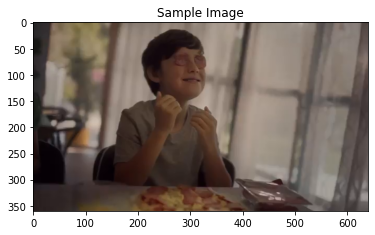

 a man and a woman are cutting a cake .
[MoviePy] >>>> Building video video_with_python_18.mp4
[MoviePy] Writing audio in video_with_python_18TEMP_MPY_wvf_snd.mp3


100%|██████████| 53/53 [00:00<00:00, 952.89it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_18.mp4



 98%|█████████▊| 60/61 [00:00<00:00, 407.30it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_18.mp4 

595



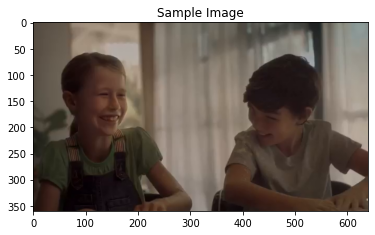

 a man and a woman are playing a video game .
[MoviePy] >>>> Building video video_with_python_19.mp4
[MoviePy] Writing audio in video_with_python_19TEMP_MPY_wvf_snd.mp3


100%|██████████| 63/63 [00:00<00:00, 1030.61it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_19.mp4



100%|██████████| 71/71 [00:00<00:00, 370.14it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_19.mp4 

618



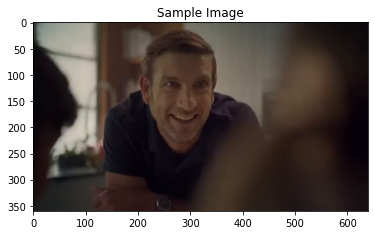

 a woman is holding a video game controller .
[MoviePy] >>>> Building video video_with_python_20.mp4
[MoviePy] Writing audio in video_with_python_20TEMP_MPY_wvf_snd.mp3


100%|██████████| 71/71 [00:00<00:00, 1042.50it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_20.mp4



100%|██████████| 80/80 [00:00<00:00, 319.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_20.mp4 

643



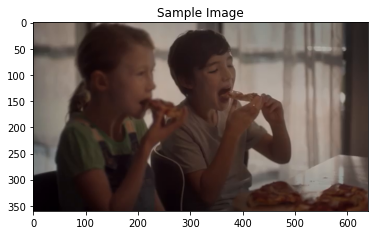

 a man and a woman are cutting a cake .
[MoviePy] >>>> Building video video_with_python_21.mp4
[MoviePy] Writing audio in video_with_python_21TEMP_MPY_wvf_snd.mp3


100%|██████████| 53/53 [00:00<00:00, 964.23it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_21.mp4



 98%|█████████▊| 60/61 [00:00<00:00, 414.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_21.mp4 

664
MAKE EVERYDAY

aD


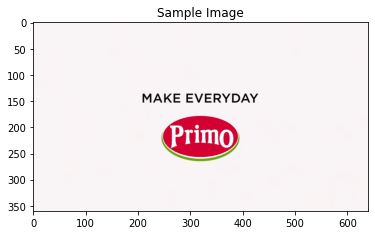

 a person holding a pair of scissors in their hands .
[MoviePy] >>>> Building video video_with_python_22.mp4
[MoviePy] Writing audio in video_with_python_22TEMP_MPY_wvf_snd.mp3


100%|██████████| 101/101 [00:00<00:00, 1051.38it/s]

[MoviePy] Done.
[MoviePy] Writing video video_with_python_22.mp4



100%|██████████| 115/115 [00:00<00:00, 403.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_with_python_22.mp4 



In [45]:
the_vedio = VideoFileClip(vedio_path)
# TheVedio=VideoFileClip()
clip = {}
vedios ={}
captions = {}
frame_rate = float(row1[1])
for i in range(len(frame_list)):
  # print(frame_list[i][0].get_timecode())
  # print(frame_list[i][1].get_timecode())
  print(frame_list[i][0].get_frames())
  img = Image.fromarray(the_vedio.get_frame(frame_list[i][0].get_frames()/frame_rate), 'RGB')
  img.save('my%i.png'%i)
  # img.show()
  # image captioning
  aduio_Caption('/content/my%i.png'%i , i)

  captions[i]  = vedio_caption( i , frame_rate)


  clip[i] = the_vedio.subclip( frame_list[i][0].get_timecode(),frame_list[i][1].get_timecode())

  vedios[i] = CompositeVideoClip([captions[i] , clip[i]])
  if i == 0 :
    TheVedio = vedios[i]
    
  else:
    TheVedio = concatenate_videoclips([TheVedio ,vedios[i]])
  

In [46]:
TheVedio.ipython_display(width = 280 , maxduration=200)

100%|█████████▉| 1704/1705 [00:09<00:00, 175.78it/s]


In [47]:
TheVedio.write_videofile( 'Vedio_captioned_3.mp4')

[MoviePy] >>>> Building video Vedio_captioned_3.mp4
[MoviePy] Writing audio in Vedio_captioned_3TEMP_MPY_wvf_snd.mp3


100%|██████████| 1503/1503 [00:05<00:00, 268.71it/s]

[MoviePy] Done.
[MoviePy] Writing video Vedio_captioned_3.mp4



100%|█████████▉| 1704/1705 [00:22<00:00, 74.64it/s] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: Vedio_captioned_3.mp4 

